In [7]:
import warnings
warnings.filterwarnings("ignore")


import pandas as pd
import matplotlib.pyplot as plt
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import pandas as pd
data = pd.read_csv('data/istanbul_data_fully_preprocessed.csv')

data.info()

name_cols = ['MainDistID', 'DistID', 'HcoID', 'SkuID', 'BrandID', 'District']
categorical_cols = ['HcoType', 'SalesRegionID'] 
numerical_cols = ['PaidQty', 'FGQty', 'TotalQuantity', 'Week', 'Quarter', 'Month', 'Year']
boolean_cols = ['IsReturn', 'IsMrsOrder', 'Status']

# convert categorical columns to 'category' data type
for col in categorical_cols:
    data[col] = data[col].astype('category')

# convert numerical columns to 'int' data type
for col in numerical_cols:
    data[col] = data[col].astype('int')
    
# convert name columns to str data type
for col in name_cols:
    data[col] = data[col].astype(str)

# convert boolean columns to 'bool' data type
for col in boolean_cols:
    data[col] = data[col].astype(bool)
    
raw_data = data.copy()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MainDistID     3649 non-null   int64 
 1   DistID         3649 non-null   int64 
 2   Date           3649 non-null   object
 3   HcoID          3649 non-null   int64 
 4   BrandID        3649 non-null   int64 
 5   SkuID          3649 non-null   int64 
 6   IsReturn       3649 non-null   bool  
 7   PaidQty        3649 non-null   int64 
 8   FGQty          3649 non-null   int64 
 9   IsMrsOrder     3649 non-null   bool  
 10  HcoType        3649 non-null   object
 11  District       3649 non-null   object
 12  Status         3649 non-null   bool  
 13  TotalQuantity  3649 non-null   int64 
 14  Week           3649 non-null   int64 
 15  Month          3649 non-null   int64 
 16  Quarter        3649 non-null   int64 
 17  Year           3649 non-null   int64 
 18  SalesRegionID  3649 non-null

In [8]:
segment_1_sku_ids = ["568", "578", "1050"]
segment_2_sku_ids = ["319", "509", "615", "1018"]

all_sku_ids = segment_1_sku_ids + segment_2_sku_ids

data = data[data['SkuID'].isin(all_sku_ids)]

## QUARTERLY DATA SKU AND ISTANBUL

In [9]:
quarterly_data = data.copy()

quarterly_data = quarterly_data.groupby(['Year', 'Quarter', 'SkuID']).agg({'TotalQuantity': 'sum'}).reset_index()
quarterly_data

,Year,Quarter,SkuID,TotalQuantity
0,2019,1,1018,46
1,2019,1,1050,311
2,2019,1,319,194
3,2019,1,509,327
4,2019,1,568,730
...,...,...,...,...
79,2021,4,319,211
80,2021,4,509,207
81,2021,4,568,675
82,2021,4,578,576


In [ ]:
# monthly data
monthly_data = data.copy()

monthly_data = monthly_data.groupby(['Year', 'Month', 'SkuID']).agg({'TotalQuantity': 'sum'}).reset_index()
monthly_data

### ARIMA

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

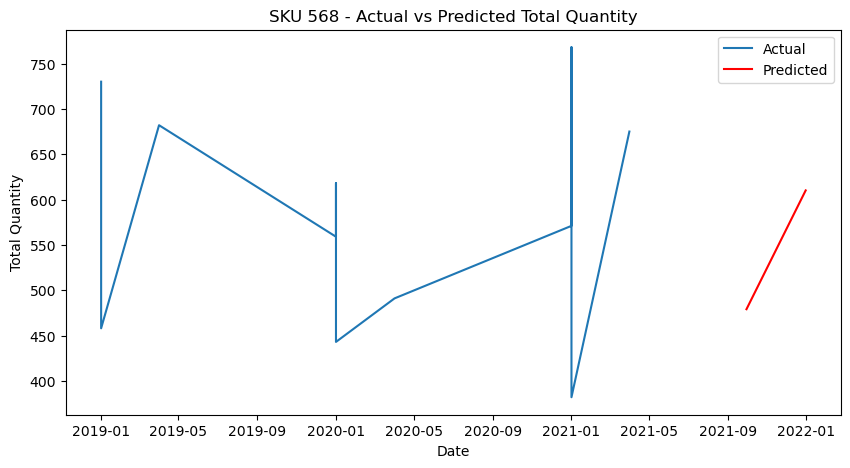

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

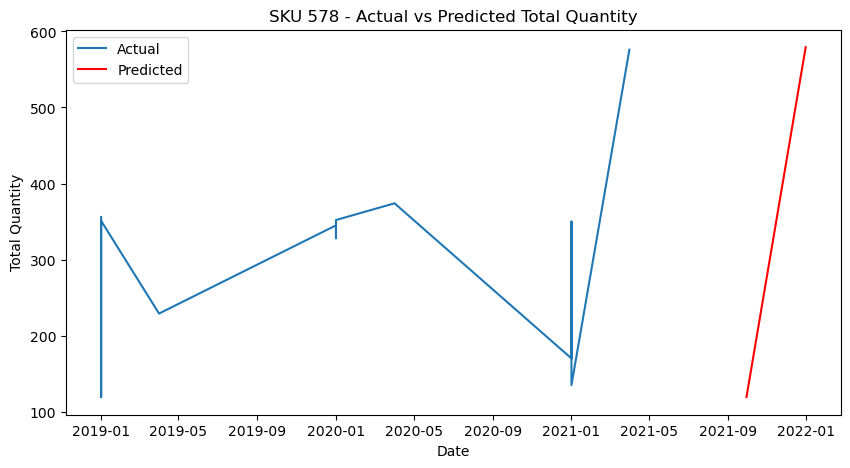

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

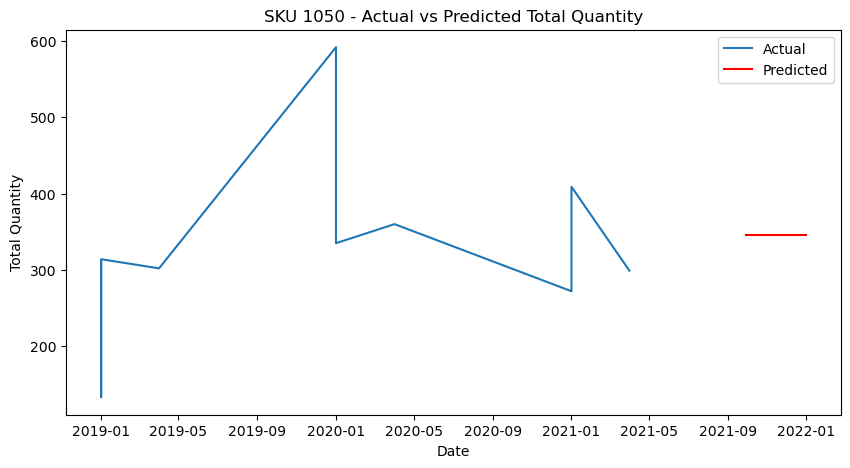

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

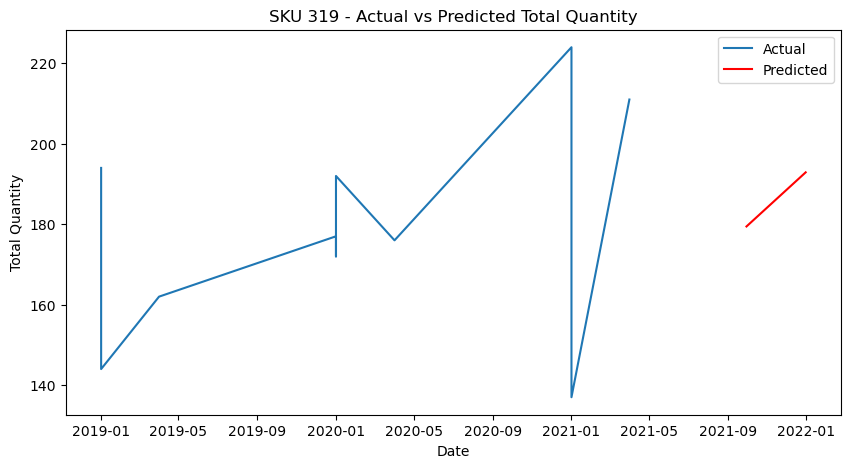

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

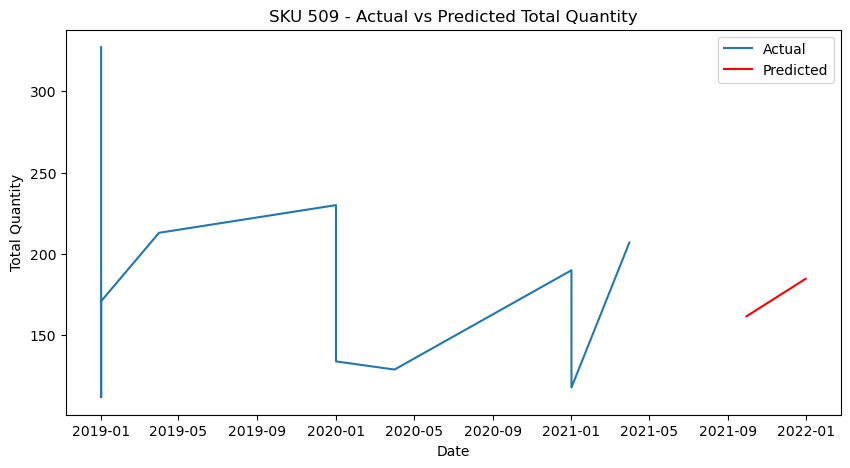

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

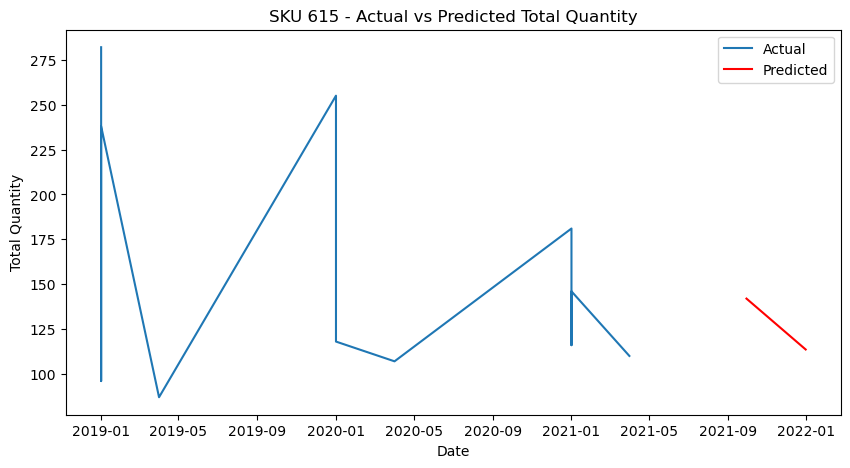

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

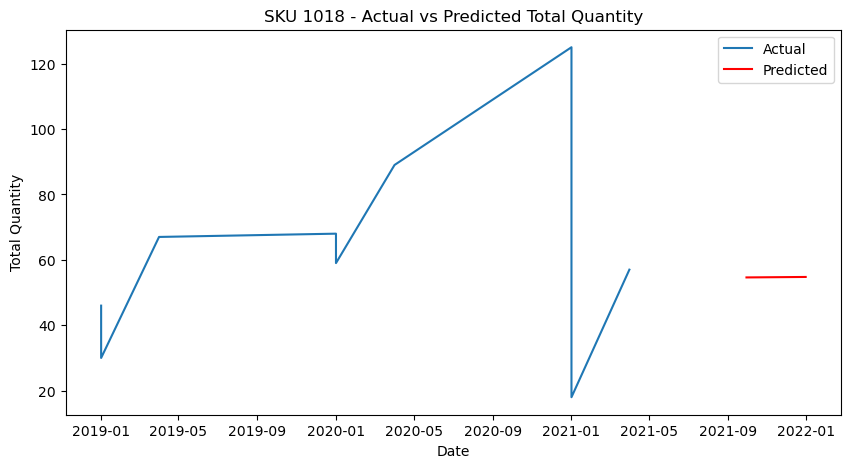

SKU: 568
Best ARIMA Model: (1, 1, 0)
MSE: 6817.216783248206
RMSE: 82.56643860097277
MAPE: 12.899180289968225
MAD: 80.98603444234291
Actual Values for last 2 quarters: [382 675]
Predicted Values for last 2 quarters: 12    479.063317
13    610.091248
Name: predicted_mean, dtype: float64
                               ARIMA Results                                
Dep. Variable:          TotalQuantity   No. Observations:                   12
Model:                 ARIMA(1, 1, 0)   Log Likelihood                 -70.919
Date:                Mon, 03 Jun 2024   AIC                            145.839
Time:                        01:41:24   BIC                            146.635
Sample:                             0   HQIC                           145.337
                                 - 12                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----

In [4]:
import itertools
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Parameter combinations for ARIMA 
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)
param_combinations = list(itertools.product(p_values, d_values, q_values))

# Store the results for each SKU
results = {}

# Load data (assuming your data is in a dataframe called quarterly_data)
dfArima = quarterly_data.copy()
dfArima['Date'] = pd.to_datetime(dfArima['Year'].astype(str) + '-' + dfArima['Quarter'].astype(str))
dfArima.set_index('Date', inplace=True)
dfArima.index = dfArima.index.to_period('Q').to_timestamp('S')

# Loop through each SKU and find the best ARIMA parameters
for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]
    best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape, best_mad = float("inf"), None, None, None, None, None, None
    
    for param in param_combinations:
        try:
            model = ARIMA(sku_data['TotalQuantity'], order=param)
            model_fit = model.fit()
            y_pred = model_fit.forecast(steps=2)
            y_actual = sku_data['TotalQuantity'].iloc[-2:]
            mse = mean_squared_error(y_actual, y_pred)
            mape = mse / y_actual.mean()
            mad = mean_absolute_error(y_actual, y_pred)
            if mse < best_score:
                best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape, best_mad = mse, param, model_fit, y_pred, y_actual, mape, mad
        except:
            continue
    
    # Check if we have valid results before storing them
    if best_params is not None:
        summary_text = best_model.summary().as_text()
        summary_text = summary_text.replace("SARIMAX", "ARIMA")
        results[sku] = {
            'Best ARIMA Model': best_params,
            'MSE': best_score,
            'RMSE': best_score ** 0.5,
            'MAPE': best_mape,
            'MAD': best_mad,
            'Actual Values': best_y_actual.values,
            'Predicted Values': best_y_pred,
            'Model Summary ARIMA': summary_text  # Use modified summary text
        }

        # Plotting the actual vs predicted values
        plt.figure(figsize=(10, 5))
        plt.plot(sku_data.index, sku_data['TotalQuantity'], label='Actual')
        plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], best_y_pred, label='Predicted', color='red')
        plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity')
        plt.xlabel('Date')
        plt.ylabel('Total Quantity')
        plt.legend()
        plt.show()

# Print the results for each SKU
for sku, result in results.items():
    print(f"SKU: {sku}")
    print(f"Best ARIMA Model: {result['Best ARIMA Model']}")
    print(f"MSE: {result['MSE']}")
    print(f"RMSE: {result['RMSE']}")
    print(f"MAPE: {result['MAPE']}")
    print(f"MAD: {result['MAD']}")
    print(f"Actual Values for last 2 quarters: {result['Actual Values']}")
    print(f"Predicted Values for last 2 quarters: {result['Predicted Values']}")
    print(result['Model Summary ARIMA'])
    print("\n" + "="*80 + "\n")

#### Grid Search for ARIMA Parameters

In [5]:
import itertools
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Parameter combinations for ARIMA
p_values = range(0, 4)  # Expanded range
d_values = range(0, 3)  # Expanded range
q_values = range(0, 4)  # Expanded range
tol_values = [1e-4, 1e-6, 1e-8]  # Different convergence tolerances
maxiter_values = [50, 100, 200]  # Different max iterations
alpha_values = [0.01, 0.05, 0.1]  # Different significance levels for confidence intervals

param_combinations = list(itertools.product(p_values, d_values, q_values, tol_values, maxiter_values, alpha_values))

# Function to evaluate ARIMA model for a given set of parameters
def evaluate_arima_model(data, arima_order, tol, maxiter, alpha):
    try:
        model = ARIMA(data, order=arima_order)
        model_fit = model.fit(method_kwargs={"tol": tol, "maxiter": maxiter})
        aic = model_fit.aic
        return aic
    except Exception as e:
        print(f"Error fitting ARIMA{arima_order} with tol={tol}, maxiter={maxiter}, alpha={alpha}: {e}")
        return None

# Function to perform grid search for ARIMA parameters
def grid_search_arima(data):
    best_score, best_params = float("inf"), None
    for param in param_combinations:
        p, d, q, tol, maxiter, alpha = param
        arima_order = (p, d, q)
        aic = evaluate_arima_model(data, arima_order, tol, maxiter, alpha)
        if aic is not None and aic < best_score:
            best_score, best_params = aic, param
    return best_params

# Load data (assuming your data is in a dataframe called quarterly_data)
dfArima = quarterly_data.copy()
dfArima['Date'] = pd.to_datetime(dfArima['Year'].astype(str) + '-' + dfArima['Quarter'].astype(str))
dfArima.set_index('Date', inplace=True)
dfArima.index = dfArima.index.to_period('Q').to_timestamp('S')

# Diagnostics: Check for missing values and data quality
print(dfArima.isnull().sum())  # Check for missing values
print(dfArima.describe())  # Get an overview of the data

# Find best ARIMA parameters for each SKU
best_params_dict = {}
for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    best_params = grid_search_arima(sku_data)
    best_params_dict[sku] = best_params
    print(f'SKU: {sku}, Best ARIMA Parameters: {best_params}')

# Print best parameters for each SKU
for sku, params in best_params_dict.items():
    print(f'SKU: {sku}, Best ARIMA Parameters: {params}')

Year             0
Quarter          0
SkuID            0
TotalQuantity    0
dtype: int64
              Year    Quarter  TotalQuantity
count    84.000000  84.000000      84.000000
mean   2020.000000   2.500000     258.940476
std       0.821401   1.124749     180.792989
min    2019.000000   1.000000      18.000000
25%    2019.000000   1.750000     128.000000
50%    2020.000000   2.500000     200.000000
75%    2021.000000   3.250000     350.250000
max    2021.000000   4.000000     768.000000


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.01: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.05: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 568, Best ARIMA Parameters: (0, 2, 2, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=50, a

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.05: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 578, Best ARIMA Parameters: (2, 2, 1, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=50, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=100, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-06, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=50, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=100, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 0, 2) with tol=1e-08, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 1050, Best ARIMA Parameters: (0, 2, 1, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 319, Best ARIMA Parameters: (0, 2, 2, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=50, alpha=0.05: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.01: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-06, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.05: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(2, 2, 2) with tol=1e-08, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 509, Best ARIMA Parameters: (0, 2, 1, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 615, Best ARIMA Parameters: (1, 2, 2, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.01: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-06, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.01: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.01: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting ARIMA(3, 2, 2) with tol=1e-08, maxiter=200, alpha=0.1: LU decomposition error.


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

SKU: 1018, Best ARIMA Parameters: (2, 2, 1, 0.0001, 50, 0.01)
SKU: 568, Best ARIMA Parameters: (0, 2, 2, 0.0001, 50, 0.01)
SKU: 578, Best ARIMA Parameters: (2, 2, 1, 0.0001, 50, 0.01)
SKU: 1050, Best ARIMA Parameters: (0, 2, 1, 0.0001, 50, 0.01)
SKU: 319, Best ARIMA Parameters: (0, 2, 2, 0.0001, 50, 0.01)
SKU: 509, Best ARIMA Parameters: (0, 2, 1, 0.0001, 50, 0.01)
SKU: 615, Best ARIMA Parameters: (1, 2, 2, 0.0001, 50, 0.01)
SKU: 1018, Best ARIMA Parameters: (2, 2, 1, 0.0001, 50, 0.01)


/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency inform

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

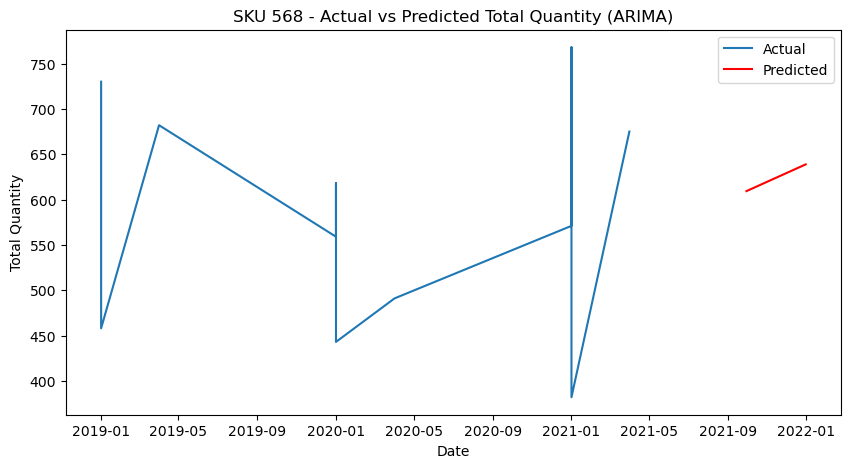

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

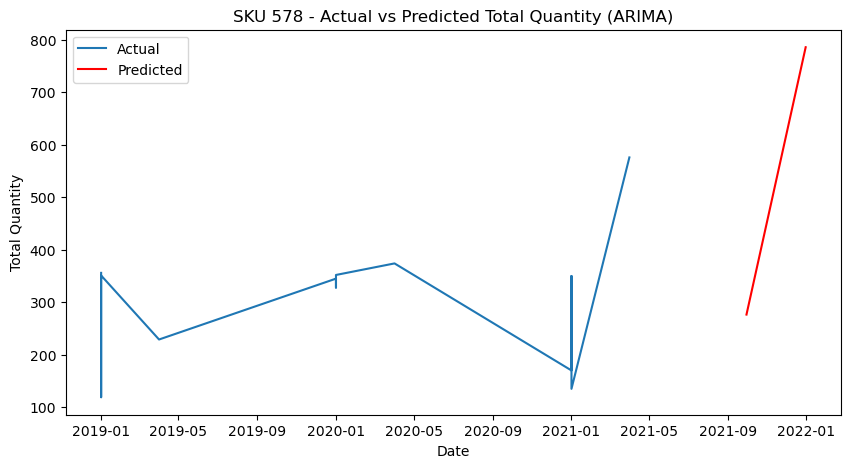

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

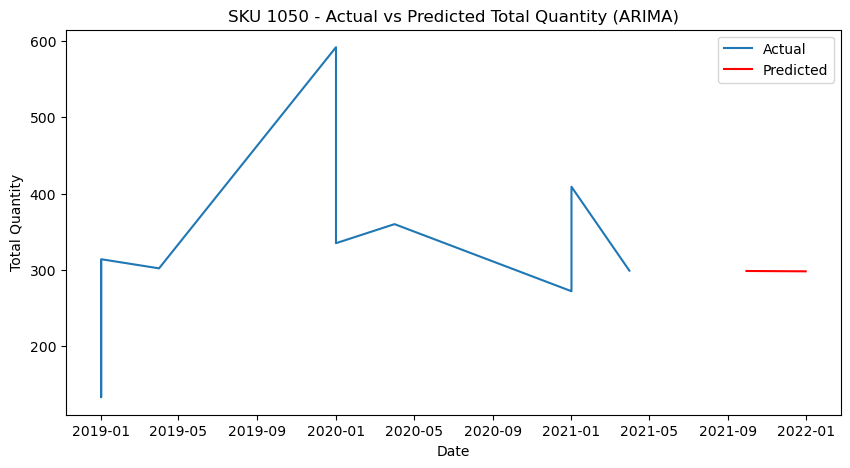

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

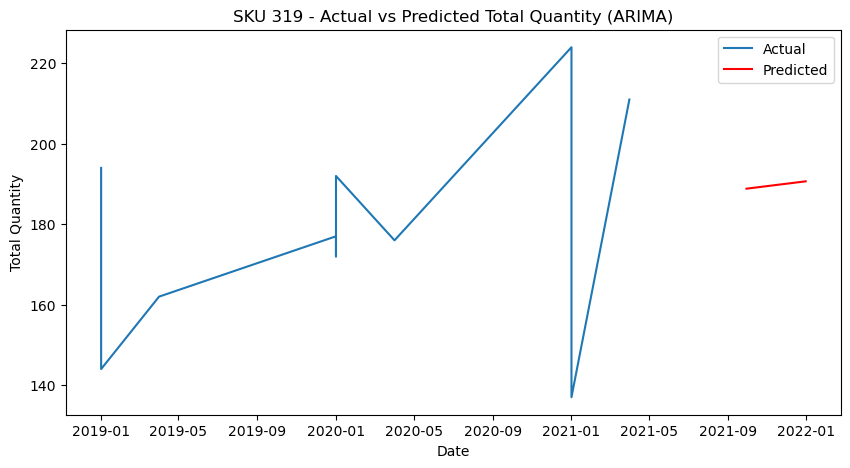

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

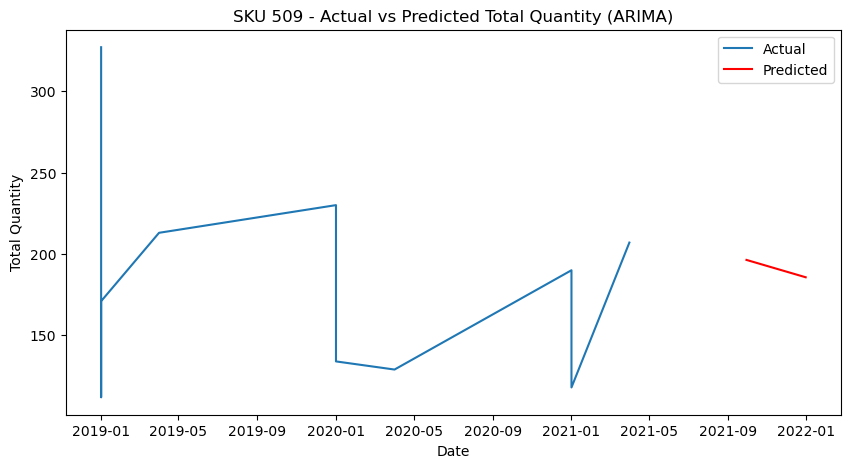

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

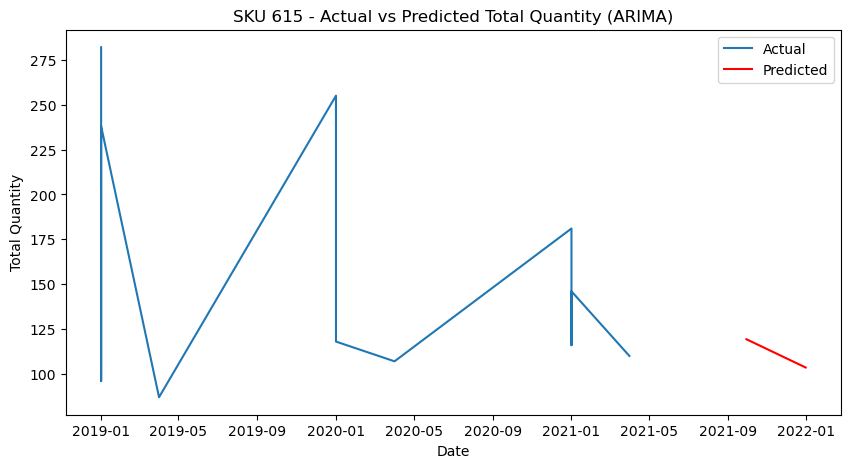

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an

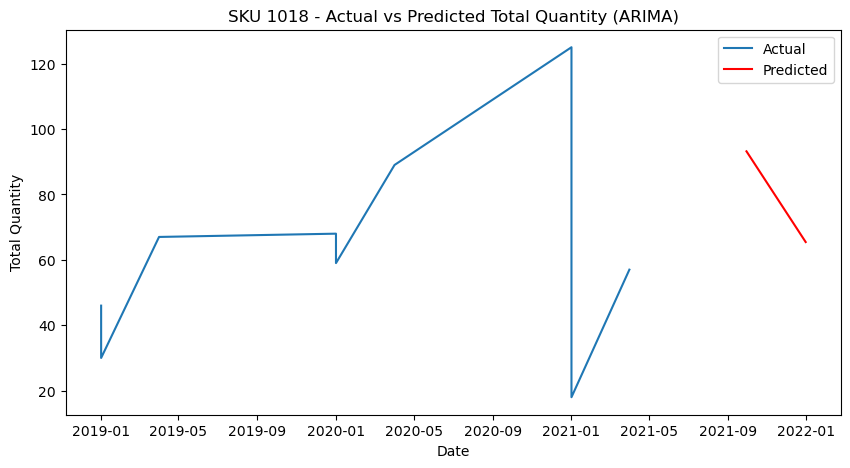

SKU: 568
Best ARIMA Model: (1, 1, 0)
MSE: 6817.216783248206
RMSE: 82.56643860097277
MAPE: 12.899180289968225
MAD: 80.98603444234291
Actual Values for last 2 quarters: [382 675]
Predicted Values for last 2 quarters: 12    479.063317
13    610.091248
Name: predicted_mean, dtype: float64
                               ARIMA Results                                
Dep. Variable:          TotalQuantity   No. Observations:                   12
Model:                 ARIMA(1, 1, 0)   Log Likelihood                 -70.919
Date:                Mon, 03 Jun 2024   AIC                            145.839
Time:                        01:41:24   BIC                            146.635
Sample:                             0   HQIC                           145.337
                                 - 12                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----

In [6]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Function to fit ARIMA model using best parameters
def fit_best_arima_model(data, best_params):
    p, d, q, tol, maxiter, alpha = best_params
    arima_order = (p, d, q)
    model = ARIMA(data, order=arima_order)
    model_fit = model.fit(method_kwargs={"tol": tol, "maxiter": maxiter})
    return model_fit

# Fit ARIMA model using best parameters for each SKU and plot results
for sku, params in best_params_dict.items():
    if params is None:
        print(f"Skipping SKU {sku} due to no valid parameters found.")
        continue
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    model_fit = fit_best_arima_model(sku_data, params)
    y_pred = model_fit.forecast(steps=2, alpha=params[5])
    y_actual = sku_data.iloc[-2:]
    
    plt.figure(figsize=(10, 5))
    plt.plot(sku_data.index, sku_data, label='Actual')
    plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], y_pred, label='Predicted', color='red')
    plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity (ARIMA)')
    plt.xlabel('Date')
    plt.ylabel('Total Quantity')
    plt.legend()
    plt.show()
    
for sku, result in results.items():
    print(f"SKU: {sku}")
    print(f"Best ARIMA Model: {result['Best ARIMA Model']}")
    print(f"MSE: {result['MSE']}")
    print(f"RMSE: {result['RMSE']}")
    print(f"MAPE: {result['MAPE']}")
    print(f"MAD: {result['MAD']}")
    print(f"Actual Values for last 2 quarters: {result['Actual Values']}")
    print(f"Predicted Values for last 2 quarters: {result['Predicted Values']}")
    print(result['Model Summary ARIMA'])
    print("\n" + "="*80 + "\n")
    

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=189.254, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=166.895, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=183.214, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=163.603, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=inf, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=162.406, Time=0.03 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=163.824, Time=0.05 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=155.042, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=155.183, Time=0.04 sec
 ARIMA(3,0

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


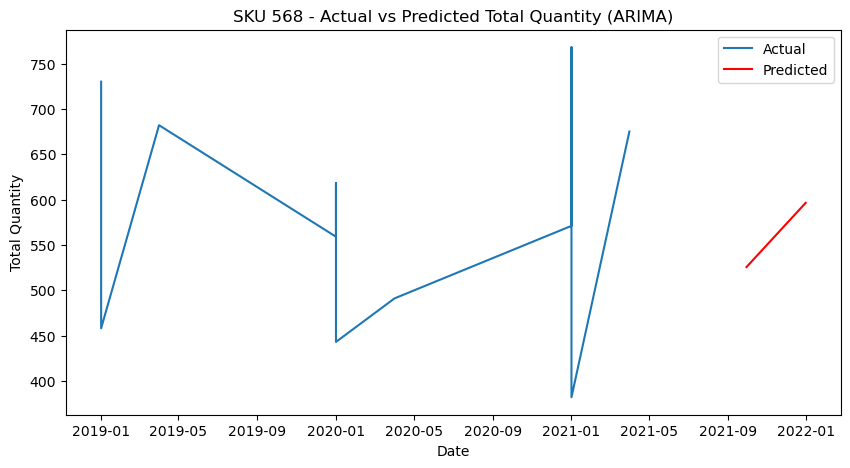

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


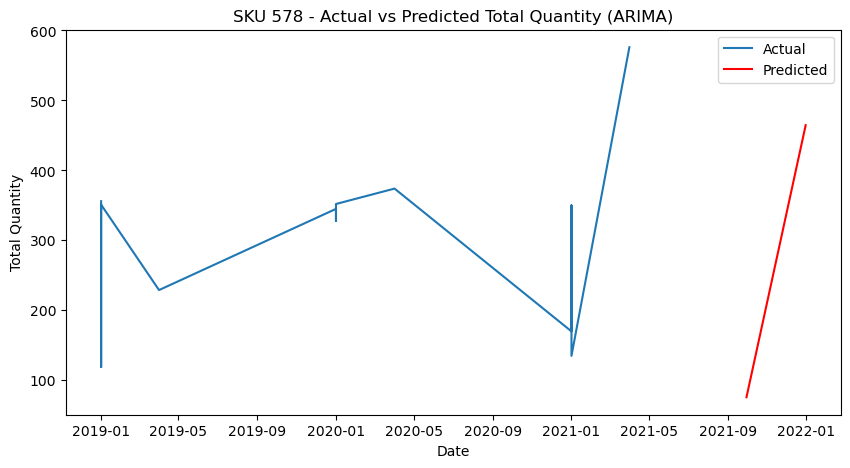

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


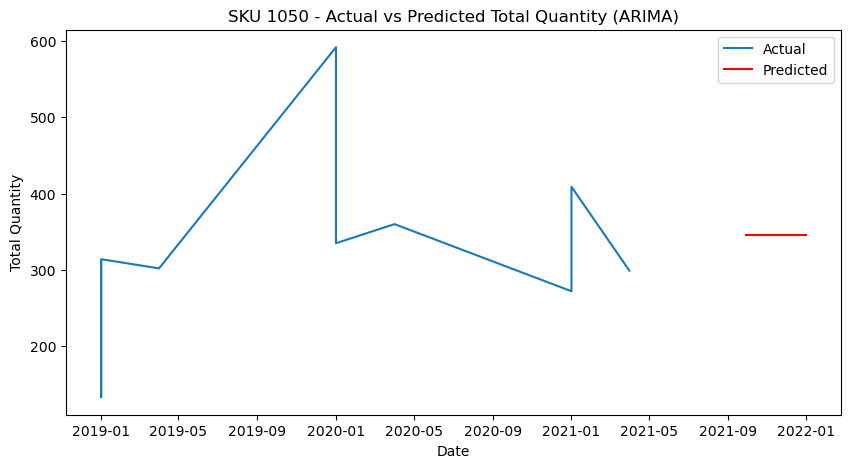

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


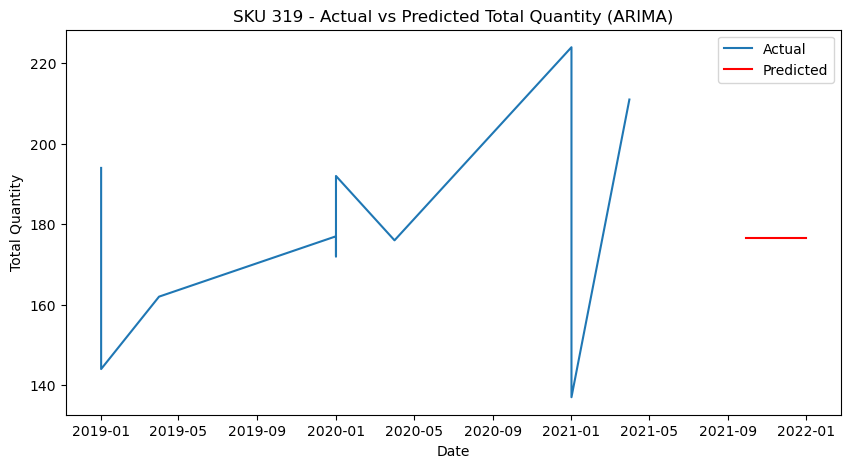

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


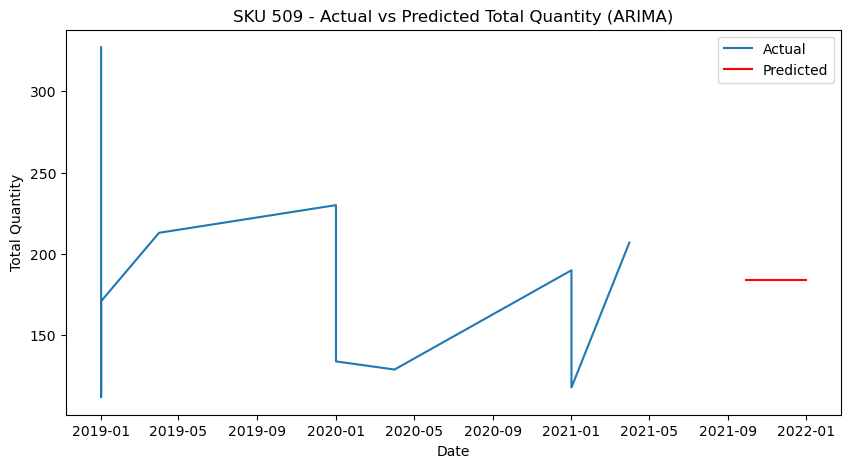

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


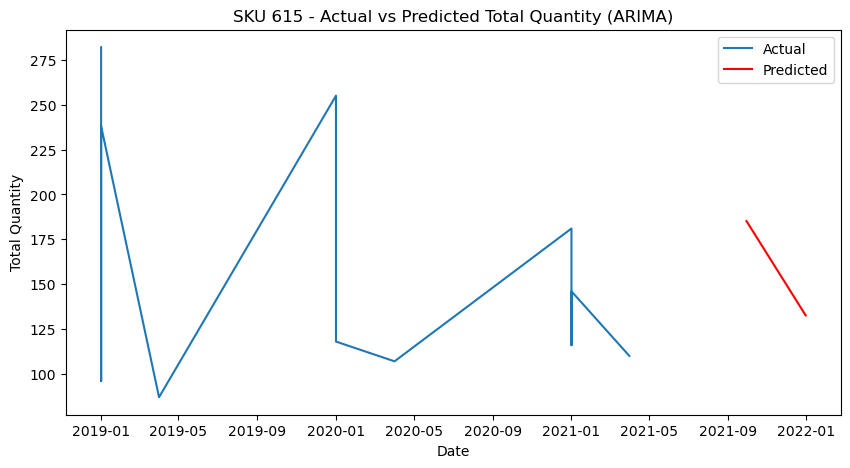

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


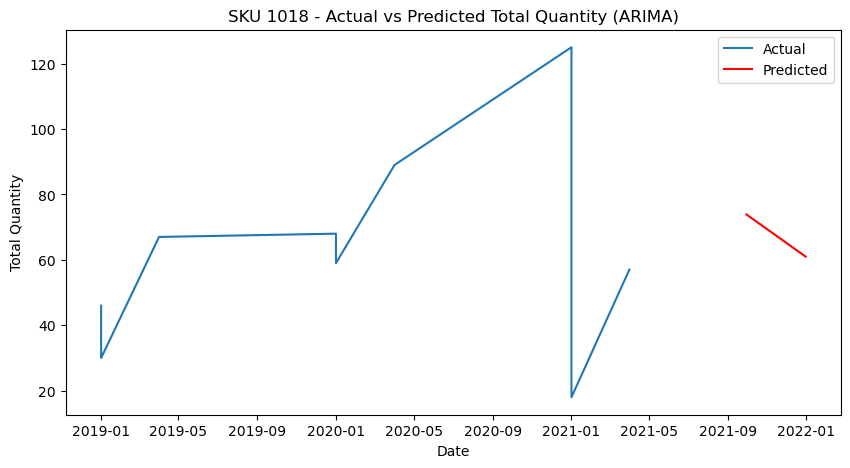

SKU: 568
Best ARIMA Model: (1, 0, 0)
MSE: 673.0915839491972
RMSE: 25.94400863300036
MAPE: 17.949108905311927
MAD: 19.42752433792196
Actual Values for last 2 quarters: [382 675]
Predicted Values for last 2 quarters: 12    525.539479
13    596.363892
dtype: float64
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   12
Model:               SARIMAX(1, 0, 0)   Log Likelihood                 -72.723
Date:                Mon, 03 Jun 2024   AIC                            151.446
Time:                        01:48:46   BIC                            152.900
Sample:                             0   HQIC                           150.907
                                 - 12                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------

In [7]:
import pmdarima as pm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load data (assuming your data is in a dataframe called quarterly_data)
dfArima = quarterly_data.copy()
dfArima['Date'] = pd.to_datetime(dfArima['Year'].astype(str) + '-' + dfArima['Quarter'].astype(str))
dfArima.set_index('Date', inplace=True)
dfArima.index = dfArima.index.to_period('Q').to_timestamp('S')

# Find best ARIMA parameters for each SKU using auto_arima
best_params_dict = {}

for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    model = pm.auto_arima(sku_data, seasonal=False, stepwise=True, trace=True)
    best_params_dict[sku] = model

# Fit ARIMA model using best parameters for each SKU and plot results
results = {}
for sku, model in best_params_dict.items():
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    model_fit = model.fit(sku_data)
    y_pred = model_fit.predict(n_periods=2)
    y_actual = sku_data.iloc[-2:]
    
    # Calculate errors
    mse = mean_squared_error(y_actual, y_pred)
    mape = mean_absolute_error(y_actual, y_pred) / y_actual.mean()
    mad = mean_absolute_error(y_actual, y_pred)

    # Store results
    results[sku] = {
        'Best ARIMA Model': model.order,
        'MSE': best_score,
        'RMSE': best_score ** 0.5,
        'MAPE': best_mape,
        'MAD': best_mad,
        'Actual Values': y_actual.values,
        'Predicted Values': y_pred,
        'Model Summary ARIMA': model_fit.summary()
    }
    
    # Plotting the actual vs predicted values
    plt.figure(figsize=(10, 5))
    plt.plot(sku_data.index, sku_data, label='Actual')
    plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], y_pred, label='Predicted', color='red')
    plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity (ARIMA)')
    plt.xlabel('Date')
    plt.ylabel('Total Quantity')
    plt.legend()
    plt.show()

# Print the results for each SKU
for sku, result in results.items():
    print(f"SKU: {sku}")
    print(f"Best ARIMA Model: {result['Best ARIMA Model']}")
    print(f"MSE: {result['MSE']}")
    print(f"RMSE: {result['RMSE']}")
    print(f"MAPE: {result['MAPE']}")
    print(f"MAD: {result['MAD']}")
    print(f"Actual Values for last 2 quarters: {result['Actual Values']}")
    print(f"Predicted Values for last 2 quarters: {result['Predicted Values']}")
    print(result['Model Summary ARIMA'])
    print("\n" + "="*80 + "\n")

### SARIMAX

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

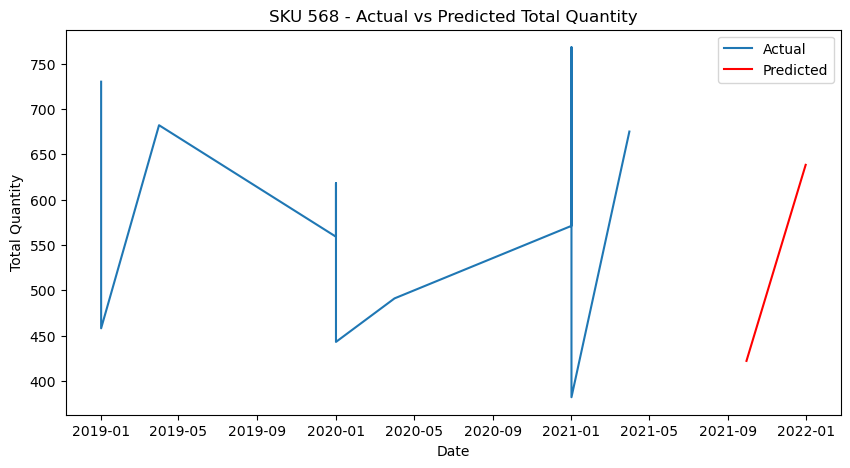

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

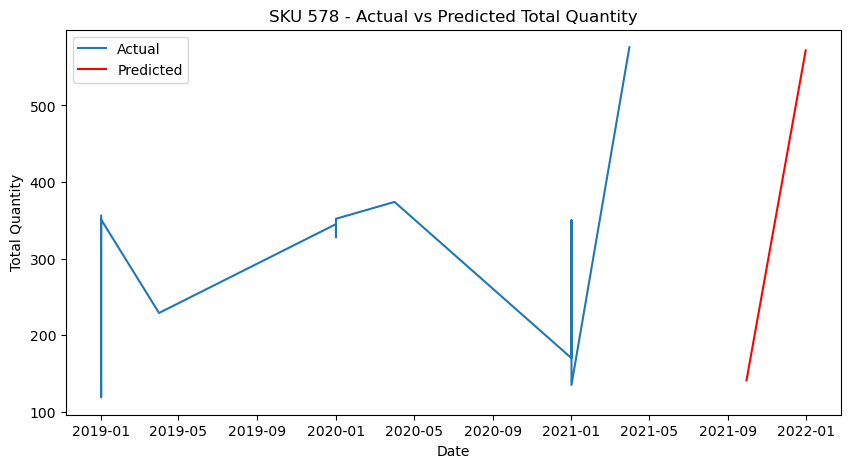

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

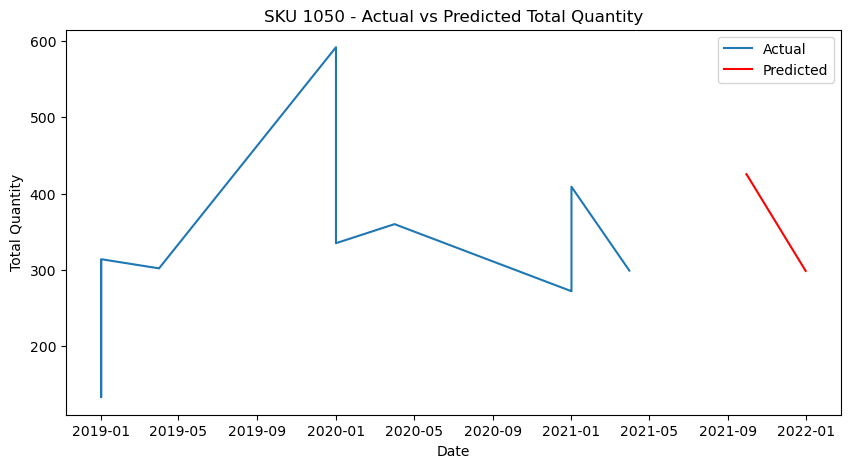

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

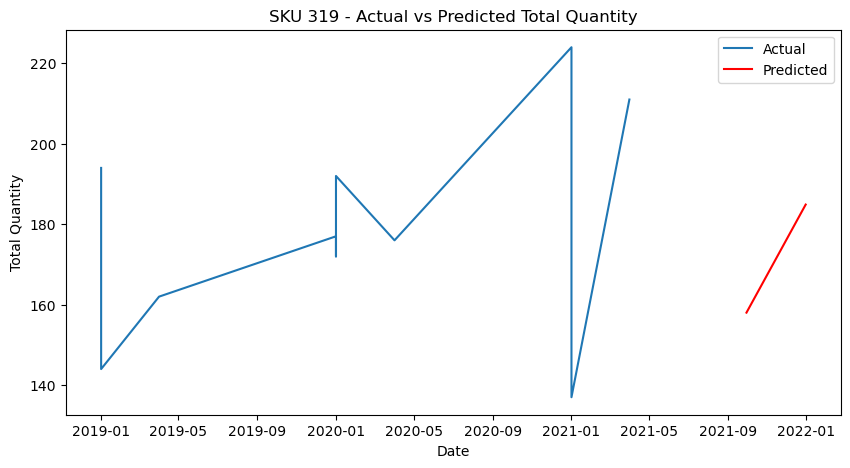

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

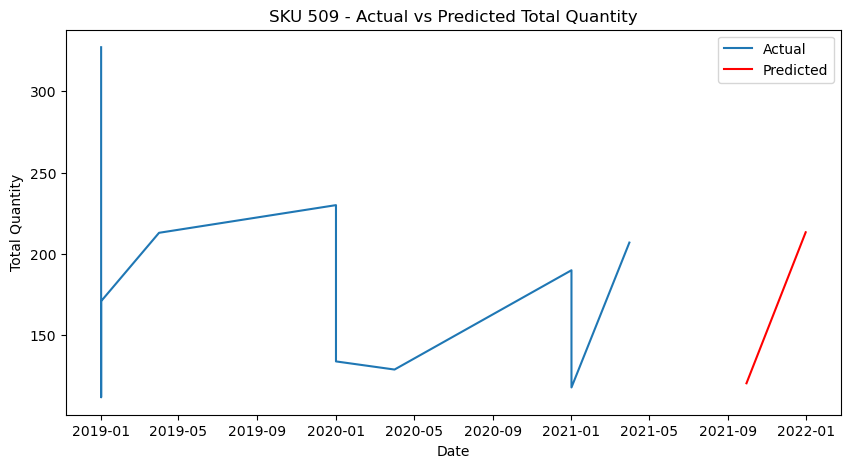

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

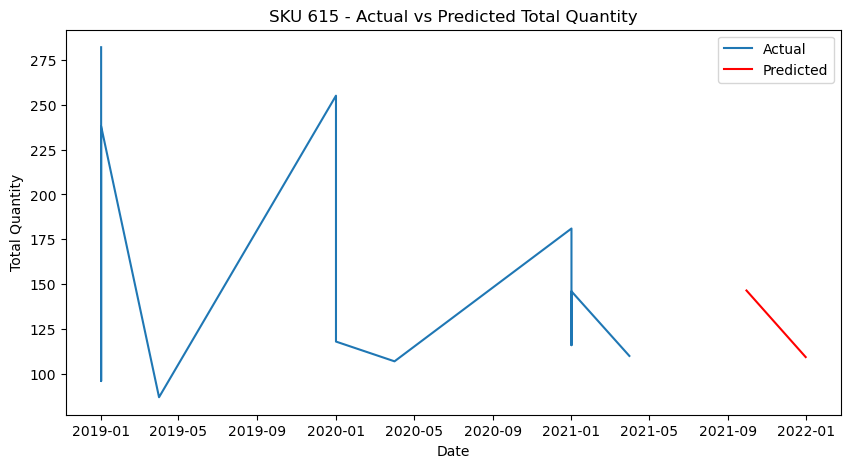

/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/aleynahasagdas/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so wil

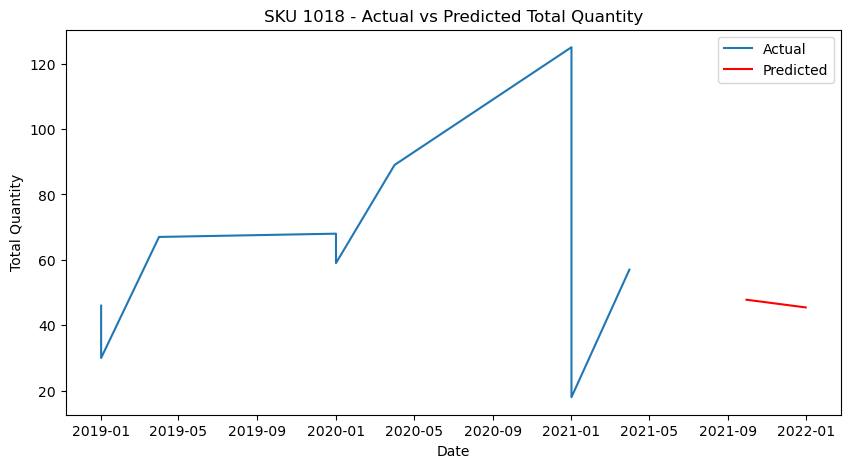

SKU: 568
Best SARIMA Model: (0, 0, 2, 2, 0, 2, 4)
MSE: 1476.0065788020247
RMSE: 38.4188310441901
MAPE: 2.792822287231835
MAD: 19.42752433792196
Actual Values for last 2 quarters: [382 675]
Predicted Values for last 2 quarters: 12    422.050750
13    638.285553
Name: predicted_mean, dtype: float64
                                     SARIMAX Results                                     
Dep. Variable:                     TotalQuantity   No. Observations:                   12
Model:             SARIMAX(0, 0, 2)x(2, 0, 2, 4)   Log Likelihood                 -78.304
Date:                           Mon, 03 Jun 2024   AIC                            170.608
Time:                                   01:49:31   BIC                            174.002
Sample:                                        0   HQIC                           169.351
                                            - 12                                         
Covariance Type:                             opg                        

In [8]:
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

# Parameter combinations
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)
P_values = range(0, 3)
D_values = range(0, 2)
Q_values = range(0, 3)
s_values = [4]  # Quarterly seasonality
param_combinations = list(itertools.product(p_values, d_values, q_values, P_values, D_values, Q_values, s_values))

results = {}

dfSarimax = quarterly_data.copy()
dfSarimax['Date'] = pd.to_datetime(dfSarimax['Year'].astype(str) + '-' + dfSarimax['Quarter'].astype(str))
dfSarimax.set_index('Date', inplace=True)
dfSarimax.index = dfSarimax.index.to_period('Q').to_timestamp('S')


# Loop through each SKU and find the best SARIMA parameters
for sku in all_sku_ids:
    sku_data = dfSarimax[dfSarimax['SkuID'] == sku]
    best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape = float("inf"), None, None, None, None, None
    
    for param in param_combinations:
        try:
            model = SARIMAX(sku_data['TotalQuantity'], order=param[:3], seasonal_order=param[3:])
            model_fit = model.fit(disp=False)
            y_pred = model_fit.forecast(steps=2)
            y_actual = sku_data['TotalQuantity'].iloc[-2:]
            mse = mean_squared_error(y_actual, y_pred)
            mape = mse / y_actual.mean()
            if mse < best_score:
                best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape = mse, param, model_fit, y_pred, y_actual, mape
        except:
            continue
    
    results[sku] = {
        'Best SARIMA Model': best_params,
        'MSE': best_score,
        'RMSE': best_score ** 0.5,
        'MAPE': best_mape,
        'MAD': best_mad,
        'Actual Values': best_y_actual.values,
        'Predicted Values': best_y_pred,
        'Model Summary': best_model.summary()
    }

    # Plotting the actual vs predicted values
    plt.figure(figsize=(10, 5))
    plt.plot(sku_data.index, sku_data['TotalQuantity'], label='Actual')
    plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], best_y_pred, label='Predicted', color='red')
    plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity')
    plt.xlabel('Date')
    plt.ylabel('Total Quantity')
    plt.legend()
    plt.show()

# Print the results for each SKU
for sku, result in results.items():
    print(f"SKU: {sku}")
    print(f"Best SARIMA Model: {result['Best SARIMA Model']}")
    print(f"MSE: {result['MSE']}")
    print(f"RMSE: {result['RMSE']}")
    print(f"MAPE: {result['MAPE']}")
    print(f"MAD: {result['MAD']}")
    print(f"Actual Values for last 2 quarters: {result['Actual Values']}")
    print(f"Predicted Values for last 2 quarters: {result['Predicted Values']}")
    print(result['Model Summary'])
    print("\n" + "="*80 + "\n")


#### Grid Search for SARIMAX Parameters

In [ ]:
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Function to fit SARIMAX model using the given parameters
def fit_sarimax_model(data, order, seasonal_order, tol, maxiter, alpha):
    try:
        model = SARIMAX(data, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False, tol=tol, maxiter=maxiter)
        return model_fit
    except (np.linalg.LinAlgError, ValueError) as e:
        print(f"Error fitting SARIMAX{order} with seasonal_order={seasonal_order}, tol={tol}, maxiter={maxiter}, alpha={alpha}: {e}")
        return None

# Define ranges for SARIMAX parameters
p_values = range(0, 3)
d_values = range(0, 3)
q_values = range(0, 3)
P_values = range(0, 3)
D_values = range(0, 2)
Q_values = range(0, 3)
m_values = [4]  # Seasonal period (quarterly data)
tol_values = [1e-4, 1e-6, 1e-8]
maxiter_values = [50, 100, 200]
alpha_values = [0.05, 0.1]

# Grid search for best SARIMAX parameters
best_params_sarimax = {}

# Loop through each SKU and find the best SARIMAX parameters
for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape, best_mad = float("inf"), None, None, None, None, None, None
    
    for order in itertools.product(p_values, d_values, q_values):
        for seasonal_order in itertools.product(P_values, D_values, Q_values, m_values):
            for tol in tol_values:
                for maxiter in maxiter_values:
                    for alpha in alpha_values:
                        model_fit = fit_sarimax_model(sku_data, order, seasonal_order, tol, maxiter, alpha)
                        if model_fit is not None:
                            y_pred = model_fit.forecast(steps=2)
                            y_actual = sku_data.iloc[-2:]
                            mse = mean_squared_error(y_actual, y_pred)
                            mape = mean_absolute_error(y_actual, y_pred) / y_actual.mean()
                            mad = mean_absolute_error(y_actual, y_pred)
                            if mse < best_score:
                                best_score, best_params, best_model, best_y_pred, best_y_actual, best_mape, best_mad = mse, (order, seasonal_order, tol, maxiter, alpha), model_fit, y_pred, y_actual, mape, mad
    
    # Store the best parameters for the SKU
    best_params_sarimax[sku] = best_params
    
    # Plotting the actual vs predicted values if we have valid results
    if best_model is not None:
        plt.figure(figsize=(10, 5))
        plt.plot(sku_data.index, sku_data, label='Actual')
        plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], best_y_pred, label='Predicted', color='red')
        plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity (SARIMAX)')
        plt.xlabel('Date')
        plt.ylabel('Total Quantity')
        plt.legend()
        plt.show()
        
        print(f"SKU: {sku}")
        print(f"Best SARIMAX Model: {best_params}")
        print(f"MSE: {best_score}")
        print(f"MAPE: {best_mape}")
        print(f"MAD: {best_mad}")
        print(f"Actual Values for last 2 quarters: {best_y_actual.values}")
        print(f"Predicted Values for last 2 quarters: {best_y_pred}")
        print(best_model.summary())
        print("\n" + "="*80 + "\n")
    else:
        print(f"SKU: {sku} - No valid SARIMAX model found.")

Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=50, alpha=0.1: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=100, alpha=0.05: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=100, alpha=0.1: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=200, alpha=0.05: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=0.0001, maxiter=200, alpha=0.1: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=1e-06, maxiter=50, alpha=0.05: LU decomposition error.
Error fitting SARIMAX(0, 0, 2) with seasonal_order=(2, 0, 1, 4), tol=1e-06, maxiter=50, alpha=0.1: LU decomposition error.
Er

### EXPONENTIAL SMOOTHING WITH PARAMETER OPTIMIZATION


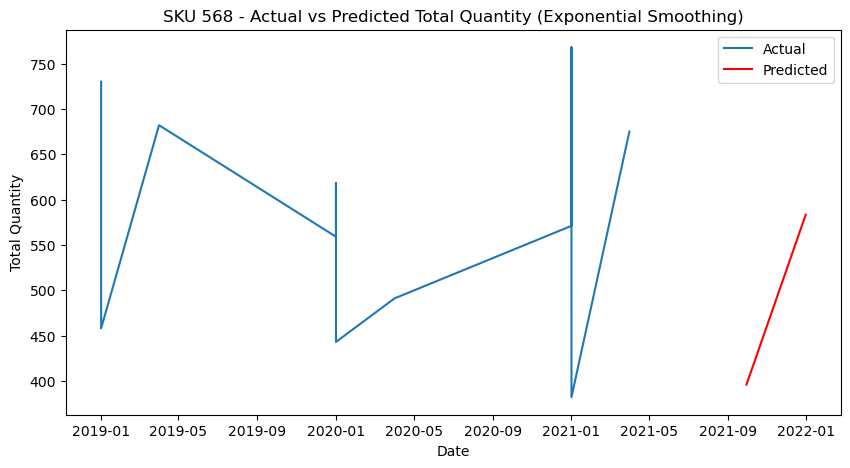

SKU: 568, Best Params: ('mul', 'mul', 4, 0.4, 0.2, 0.8), MSE: 4313.544318089478, RMSE: 65.67757850354623 ,MAPE: 0.10006687422068465, MAD: 52.88534302563184


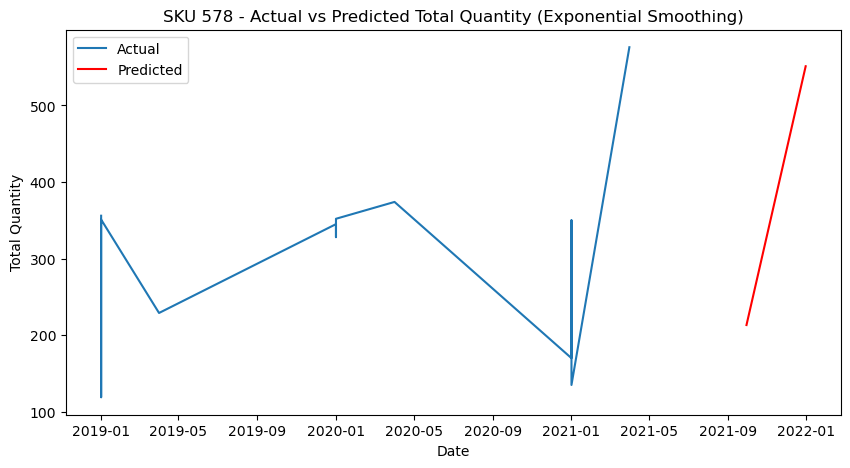

SKU: 578, Best Params: ('add', 'mul', 4, 0.6, 0.2, 0.8), MSE: 3369.893441950563, RMSE: 58.05078330178296 ,MAPE: 0.14499480870230722, MAD: 51.54565449367021


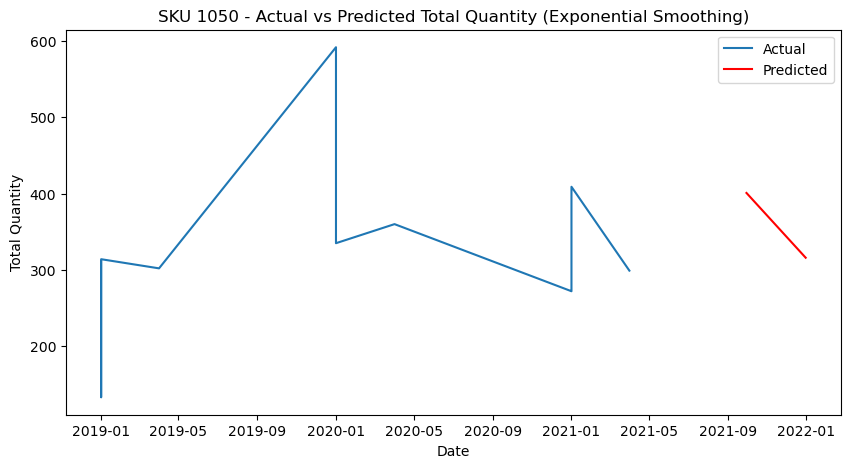

SKU: 1050, Best Params: ('add', 'add', 4, 0.2, 0.4, 0.2), MSE: 176.4734377122788, RMSE: 13.28433053308592 ,MAPE: 0.035396082606439366, MAD: 12.530213242679537


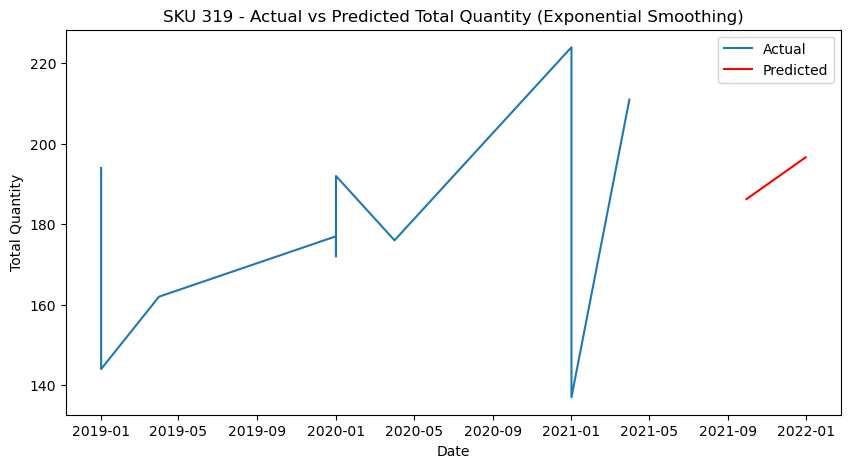

SKU: 319, Best Params: ('add', None, 4, 0.6, 0.8, 0.2), MSE: 1315.0761276867036, RMSE: 36.26397837643718 ,MAPE: 0.1827405392032781, MAD: 31.79685382137039


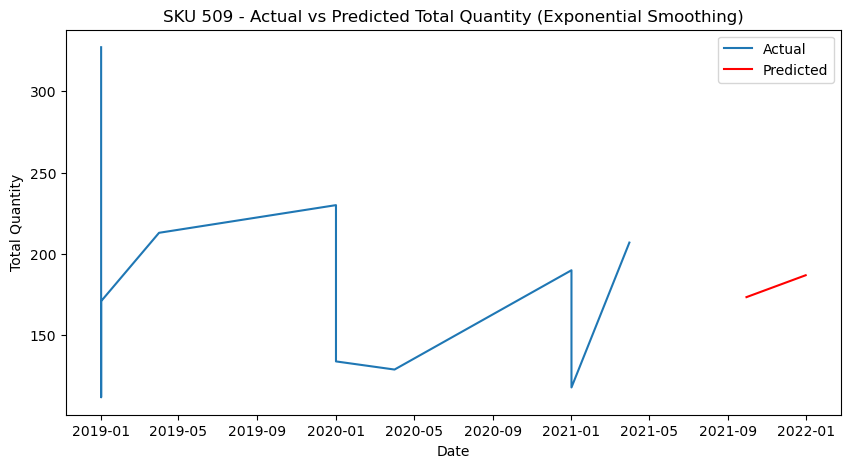

SKU: 509, Best Params: ('mul', None, 4, 0.4, 0.8, 0.2), MSE: 1740.955444429862, RMSE: 41.72475817101714 ,MAPE: 0.23249390438694525, MAD: 37.780259462878604


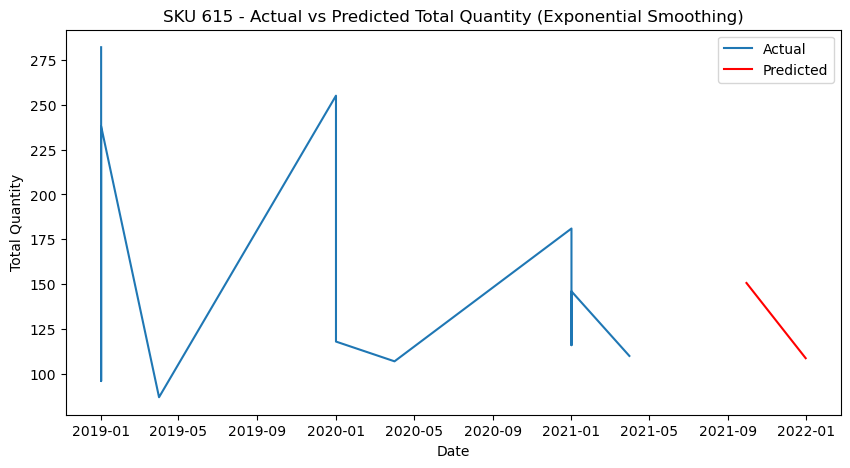

SKU: 615, Best Params: ('add', 'add', 4, 0.6, 0.8, 0.8), MSE: 11.624172608674272, RMSE: 3.4094240875365256 ,MAPE: 0.02309743405565784, MAD: 2.9564715591242035


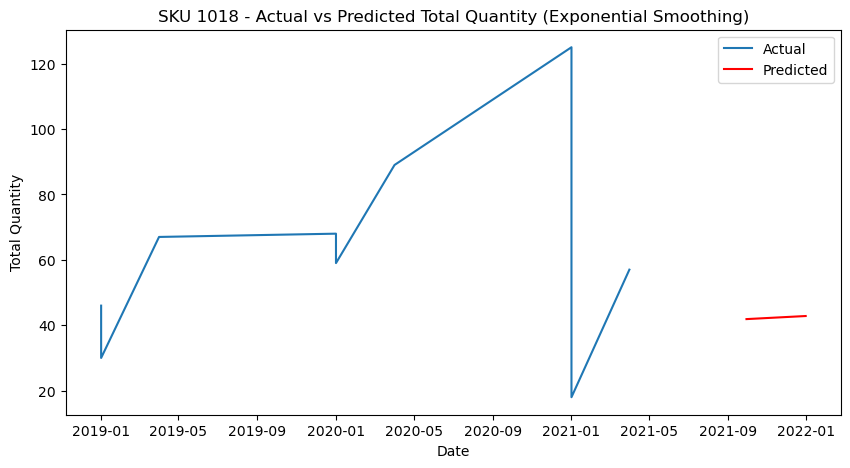

SKU: 1018, Best Params: ('add', None, 4, 0.8, 0.8, 0.2), MSE: 385.6600355873275, RMSE: 19.638228932042917 ,MAPE: 0.5074397577849837, MAD: 19.02899091693689


In [10]:
import itertools
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Parametre kombinasyonları
trend_options = [None, 'add', 'mul']
seasonal_options = [None, 'add', 'mul']
seasonal_periods_options = [4]  # Quarterly data
alpha_values = [0.2, 0.4, 0.6, 0.8]
beta_values = [0.2, 0.4, 0.6, 0.8]
gamma_values = [0.2, 0.4, 0.6, 0.8]

best_params_dict = {}


dfArima = quarterly_data.copy()
dfArima['Date'] = pd.to_datetime(dfArima['Year'].astype(str) + '-' + dfArima['Quarter'].astype(str))
dfArima.set_index('Date', inplace=True)
dfArima.index = dfArima.index.to_period('Q').to_timestamp('S')

# Grid search fonksiyonu
def fit_exponential_smoothing(data):
    best_mse = float('inf')
    best_params = None
    best_model_fit = None

    for trend, seasonal, seasonal_periods, alpha, beta, gamma in itertools.product(trend_options, seasonal_options, seasonal_periods_options, alpha_values, beta_values, gamma_values):
        try:
            model = ExponentialSmoothing(
                data,
                trend=trend,
                seasonal=seasonal,
                seasonal_periods=seasonal_periods
            )
            model_fit = model.fit(smoothing_level=alpha, smoothing_slope=beta, smoothing_seasonal=gamma)
            y_pred = model_fit.forecast(steps=2)
            y_actual = data.iloc[-2:]
            mse = mean_squared_error(y_actual, y_pred)

            if mse < best_mse:
                best_mse = mse
                best_params = (trend, seasonal, seasonal_periods, alpha, beta, gamma)
                best_model_fit = model_fit
        except:
            continue

    return best_params, best_model_fit

# Fit Exponential Smoothing model for each SKU and plot results


for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    best_params, model_fit = fit_exponential_smoothing(sku_data)
    y_pred = model_fit.forecast(steps=2)
    y_actual = sku_data.iloc[-2:]
    
    plt.figure(figsize=(10, 5))
    plt.plot(sku_data.index, sku_data, label='Actual')
    plt.plot(pd.date_range(start=sku_data.index[-1], periods=3, freq='Q')[1:], y_pred, label='Predicted', color='red')
    plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity (Exponential Smoothing)')
    plt.xlabel('Date')
    plt.ylabel('Total Quantity')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_actual, y_pred)
    rmse = mse ** 0.5
    mape = mean_absolute_error(y_actual, y_pred) / y_actual.mean()
    mad = mean_absolute_error(y_actual, y_pred)
    best_params_dict[sku] = best_params
    print(f'SKU: {sku}, Best Params: {best_params}, MSE: {mse}, RMSE: {rmse} ,MAPE: {mape}, MAD: {mad}')

In [ ]:
### Moving Average
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Function to fit Moving Average model
def fit_moving_average(data, window):
    rolling_mean = data.rolling(window=window).mean()
    return rolling_mean

# Define window sizes for Moving Average
window_sizes = [2, 3, 4, 5, 6]

# Find best window size
best_params_ma = {}
for sku in all_sku_ids:
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    best_mse = float('inf')
    best_window = None

    for window in window_sizes:
        if len(sku_data) < window:
            continue
        rolling_mean = fit_moving_average(sku_data, window)
        y_pred = rolling_mean[-2:]
        y_actual = sku_data.iloc[-2:]
        mse = mean_squared_error(y_actual, y_pred[window:])
        if mse < best_mse:
            best_mse = mse
            best_window = window

    best_params_ma[sku] = best_window

# Fit and plot results for best window size
for sku, window in best_params_ma.items():
    sku_data = dfArima[dfArima['SkuID'] == sku]['TotalQuantity']
    rolling_mean = fit_moving_average(sku_data, window)
    y_pred = rolling_mean.dropna()[-2:]  # Drop NaN values
    y_actual = sku_data.iloc[-2:]

    plt.figure(figsize=(10, 5))
    plt.plot(sku_data.index, sku_data, label='Actual')
    plt.plot(rolling_mean.index, rolling_mean, label='Predicted', color='red')
    plt.title(f'SKU {sku} - Actual vs Predicted Total Quantity (Moving Average)')
    plt.xlabel('Date')
    plt.ylabel('Total Quantity')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_actual, y_pred)
    mape = mean_absolute_error(y_actual, y_pred) / y_actual.mean()
    mad = mean_absolute_error(y_actual, y_pred)
    print(f'SKU: {sku}, Best Window Size: {window}, MSE: {mse}, MAPE: {mape}, MAD: {mad}')